In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from warnings import filterwarnings
filterwarnings("ignore")

In [2]:
df = pd.read_csv("AviationData.csv", engine='python')

In [3]:
# lets try to look the data
df.head()

,Event.Id,Investigation.Type,Accident.Number,Event.Date,Location,Country,Latitude,Longitude,Airport.Code,Airport.Name,...,Purpose.of.Flight,Air.Carrier,Total.Fatal.Injuries,Total.Serious.Injuries,Total.Minor.Injuries,Total.Uninjured,Weather.Condition,Broad.Phase.of.Flight,Report.Status,Publication.Date
0,20200509X11853,Accident,CEN20LA173,2020-05-09,"Haskell, OK",United States,35.864167,-95.655556,2K9,HASKELL,...,Personal,NaN,NaN,1.0,NaN,NaN,VMC,DESCENT,Preliminary,14-05-2020
1,20200508X55730,Accident,CEN20CA176,2020-05-08,"San Antonio, TX",United States,29.723334,-98.694444,5C1,NaN,...,Personal,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Preliminary,14-05-2020
2,20200507X60215,Accident,CEN20CA174,2020-05-06,"Gonazales, TX",United States,29.529167,-97.464167,T20,Roger M Dreyer Memorial,...,Personal,NaN,NaN,NaN,NaN,2.0,VMC,NaN,Preliminary,14-05-2020
3,20200509X85739,Accident,ERA20CA175,2020-05-03,"Shirley, NY",United States,40.828056,-72.865556,HWV,BROOKHAVEN,...,Personal,NaN,NaN,NaN,NaN,1.0,VMC,NaN,Preliminary,15-05-2020
4,20200504X54503,Incident,ENG20IA031,2020-05-03,"Clewiston, FL",United States,26.735000,-81.051111,NaN,NaN,...,Personal,NaN,NaN,NaN,NaN,1.0,NaN,NaN,Preliminary,12-05-2020


In [4]:
# pick relavant data 
df= df[['Investigation.Type','Aircraft.Damage','Aircraft.Category',
            'Number.of.Engines','Engine.Type','Purpose.of.Flight',
            'Total.Fatal.Injuries','Total.Serious.Injuries','Total.Minor.Injuries',
            'Total.Uninjured','Weather.Condition','Broad.Phase.of.Flight','Event.Date']]

In [5]:
# let try to check the column names
print(df.columns.tolist())

['Investigation.Type', 'Aircraft.Damage', 'Aircraft.Category', 'Number.of.Engines', 'Engine.Type', 'Purpose.of.Flight', 'Total.Fatal.Injuries', 'Total.Serious.Injuries', 'Total.Minor.Injuries', 'Total.Uninjured', 'Weather.Condition', 'Broad.Phase.of.Flight', 'Event.Date']


In [6]:
# lets try to check the shape of dataset
df.shape

(84983, 13)

In [12]:
# let try to use the info() method to output some general information about the dataframe like as missing values , types etc
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 84983 entries, 0 to 84982
Data columns (total 31 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Event.Id                84983 non-null  object 
 1   Investigation.Type      84978 non-null  object 
 2   Accident.Number         84983 non-null  object 
 3   Event.Date              84983 non-null  object 
 4   Location                84905 non-null  object 
 5   Country                 84476 non-null  object 
 6   Latitude                30658 non-null  float64
 7   Longitude               30649 non-null  float64
 8   Airport.Code            48005 non-null  object 
 9   Airport.Name            50746 non-null  object 
 10  Injury.Severity         84983 non-null  object 
 11  Aircraft.Damage         82096 non-null  object 
 12  Aircraft.Category       28257 non-null  object 
 13  Registration.Number     80837 non-null  object 
 14  Make                    84913 non-null

In [7]:
# For the label variable, delete the rows with unknown value
df[df['Total.Fatal.Injuries']==0]

,Investigation.Type,Aircraft.Damage,Aircraft.Category,Number.of.Engines,Engine.Type,Purpose.of.Flight,Total.Fatal.Injuries,Total.Serious.Injuries,Total.Minor.Injuries,Total.Uninjured,Weather.Condition,Broad.Phase.of.Flight,Event.Date
18919,Accident,Substantial,Helicopter,1.0,NaN,Other Work Use,0.0,0.0,0.0,3.0,VMC,NaN,2009-03-04
18986,Accident,Substantial,Helicopter,NaN,NaN,Unknown,0.0,0.0,0.0,18.0,VMC,NaN,2009-02-18
18999,Accident,Substantial,Airplane,1.0,NaN,NaN,0.0,0.0,3.0,0.0,VMC,NaN,2009-02-14
19110,Incident,Minor,Airplane,NaN,NaN,Personal,0.0,0.0,0.0,2.0,NaN,NaN,2009-01-10
19153,Accident,Substantial,Airplane,1.0,Reciprocating,Personal,0.0,0.0,0.0,1.0,VMC,NaN,2008-12-29
...,...,...,...,...,...,...,...,...,...,...,...,...,...
84971,Accident,Substantial,Airplane,1.0,Reciprocating,Personal,0.0,0.0,0.0,2.0,VMC,TAKEOFF,1982-01-01
84972,Accident,Substantial,Airplane,2.0,Reciprocating,Business,0.0,0.0,0.0,2.0,IMC,LANDING,1982-01-01
84973,Accident,Substantial,NaN,1.0,Reciprocating,Personal,0.0,0.0,3.0,0.0,IMC,CRUISE,1982-01-01
84974,Accident,Substantial,NaN,1.0,Reciprocating,Personal,0.0,0.0,0.0,1.0,VMC,APPROACH,1982-01-01


In [8]:
# lets try to select a data where Total.Fatal.Injuries values is not null
df = df[df['Total.Fatal.Injuries'].notna()]
df

,Investigation.Type,Aircraft.Damage,Aircraft.Category,Number.of.Engines,Engine.Type,Purpose.of.Flight,Total.Fatal.Injuries,Total.Serious.Injuries,Total.Minor.Injuries,Total.Uninjured,Weather.Condition,Broad.Phase.of.Flight,Event.Date
6,Accident,Destroyed,Airplane,1.0,Reciprocating,Personal,1.0,NaN,NaN,NaN,VMC,MANEUVERING,2020-05-02
7,Accident,Substantial,Helicopter,1.0,Turbo Shaft,Public Aircraft - Local,1.0,1.0,NaN,NaN,VMC,UNKNOWN,2020-05-02
8,Accident,Substantial,Airplane,NaN,NaN,NaN,2.0,NaN,NaN,NaN,NaN,LANDING,2020-05-01
23,Accident,Destroyed,Airplane,2.0,NaN,Personal,1.0,NaN,NaN,NaN,NaN,UNKNOWN,2020-04-23
31,Accident,Destroyed,Airplane,NaN,Turbo Prop,Personal,1.0,NaN,NaN,NaN,VMC,TAKEOFF,2020-04-20
...,...,...,...,...,...,...,...,...,...,...,...,...,...
84978,Accident,Destroyed,NaN,NaN,NaN,Personal,1.0,2.0,NaN,NaN,VMC,APPROACH,1979-08-02
84979,Accident,Destroyed,NaN,1.0,Reciprocating,Personal,2.0,0.0,0.0,0.0,IMC,CRUISE,1977-06-19
84980,Accident,Destroyed,NaN,1.0,Reciprocating,Personal,3.0,NaN,NaN,NaN,IMC,CRUISE,1974-08-30
84981,Accident,Destroyed,NaN,1.0,Reciprocating,Personal,4.0,0.0,0.0,0.0,UNK,UNKNOWN,1962-07-19


In [10]:
# For numerical variables as predicators, replace missing values by mean

In [9]:
# lets try to check the percentage of missing values,unique values,percentage of one catagory values and type against each column.
stats = []
for col in df.columns:
    stats.append((col, df[col].nunique(), df[col].isnull().sum() * 100 / df.shape[0], df[col].value_counts(normalize=True, dropna=False).values[0] * 100, df[col].dtype))
    
stats_df = pd.DataFrame(stats, columns=['Feature', 'Unique_values', 'Percentage of missing values', 'percentage high one category values', 'type'])
stats_df.sort_values('Percentage of missing values', ascending=False)

,Feature,Unique_values,Percentage of missing values,percentage high one category values,type
2,Aircraft.Category,11,85.115018,85.115018,object
9,Total.Uninjured,310,12.785796,33.427797,float64
8,Total.Minor.Injuries,57,12.628357,70.018368,float64
7,Total.Serious.Injuries,40,11.375842,74.575352,float64
11,Broad.Phase.of.Flight,12,4.929590,20.951631,object
3,Number.of.Engines,5,4.812385,79.783084,float64
4,Engine.Type,12,2.823406,83.325461,object
5,Purpose.of.Flight,22,2.442054,56.293186,object
10,Weather.Condition,3,2.247879,87.278929,object
1,Aircraft.Damage,3,2.179655,65.349427,object


In [10]:
# For numerical variables , replace missing values by mean
df['Total.Uninjured'].fillna(df['Total.Uninjured'].mean(), inplace=True)
df['Total.Minor.Injuries'].fillna(df['Total.Minor.Injuries'].mean(), inplace=True)
df['Total.Serious.Injuries'].fillna(df['Total.Serious.Injuries'].mean(), inplace=True)
df['Number.of.Engines'].fillna(df['Number.of.Engines'].mean(), inplace=True)

In [11]:
#For categorical variables, treat missing values as a separate catogory
df['Aircraft.Category'].fillna('Unknown',inplace=True)
df['Aircraft.Damage'].fillna('Others',inplace=True)

df['Engine.Type'].fillna('Others',inplace=True)
df['Engine.Type'].replace(['None','Unknown'],'Others')

df['Purpose.of.Flight'].fillna('Unknown',inplace=True)
df['Weather.Condition'].fillna('UNK',inplace=True)
df['Broad.Phase.of.Flight'].fillna('UNKNOWN',inplace=True)

In [12]:
df

,Investigation.Type,Aircraft.Damage,Aircraft.Category,Number.of.Engines,Engine.Type,Purpose.of.Flight,Total.Fatal.Injuries,Total.Serious.Injuries,Total.Minor.Injuries,Total.Uninjured,Weather.Condition,Broad.Phase.of.Flight,Event.Date
6,Accident,Destroyed,Airplane,1.000000,Reciprocating,Personal,1.0,0.257945,0.37983,4.22214,VMC,MANEUVERING,2020-05-02
7,Accident,Substantial,Helicopter,1.000000,Turbo Shaft,Public Aircraft - Local,1.0,1.000000,0.37983,4.22214,VMC,UNKNOWN,2020-05-02
8,Accident,Substantial,Airplane,1.154317,Others,Unknown,2.0,0.257945,0.37983,4.22214,UNK,LANDING,2020-05-01
23,Accident,Destroyed,Airplane,2.000000,Others,Personal,1.0,0.257945,0.37983,4.22214,UNK,UNKNOWN,2020-04-23
31,Accident,Destroyed,Airplane,1.154317,Turbo Prop,Personal,1.0,0.257945,0.37983,4.22214,VMC,TAKEOFF,2020-04-20
...,...,...,...,...,...,...,...,...,...,...,...,...,...
84978,Accident,Destroyed,Unknown,1.154317,Others,Personal,1.0,2.000000,0.37983,4.22214,VMC,APPROACH,1979-08-02
84979,Accident,Destroyed,Unknown,1.000000,Reciprocating,Personal,2.0,0.000000,0.00000,0.00000,IMC,CRUISE,1977-06-19
84980,Accident,Destroyed,Unknown,1.000000,Reciprocating,Personal,3.0,0.257945,0.37983,4.22214,IMC,CRUISE,1974-08-30
84981,Accident,Destroyed,Unknown,1.000000,Reciprocating,Personal,4.0,0.000000,0.00000,0.00000,UNK,UNKNOWN,1962-07-19


In [13]:
# lets try to check missing values is present or not
print(df.isnull().sum())

Investigation.Type        0
Aircraft.Damage           0
Aircraft.Category         0
Number.of.Engines         0
Engine.Type               0
Purpose.of.Flight         0
Total.Fatal.Injuries      0
Total.Serious.Injuries    0
Total.Minor.Injuries      0
Total.Uninjured           0
Weather.Condition         0
Broad.Phase.of.Flight     0
Event.Date                0
dtype: int64


The describe method shows basic statistical characteristics of each numerical feature (int64 and float64 types): number of non-missing values, mean, standard deviation, range, median, 0.25 and 0.75 quartiles. 

In [14]:
df.describe()

,Number.of.Engines,Total.Fatal.Injuries,Total.Serious.Injuries,Total.Minor.Injuries,Total.Uninjured
count,57165.000000,57165.000000,57165.000000,57165.000000,57165.000000
mean,1.154317,0.854456,0.257945,0.379830,4.222140
std,0.440641,6.331490,1.299179,2.070022,22.142249
min,0.000000,0.000000,0.000000,0.000000,0.000000
25%,1.000000,0.000000,0.000000,0.000000,0.000000
50%,1.000000,0.000000,0.000000,0.000000,1.000000
75%,1.000000,1.000000,0.257945,0.379830,3.000000
max,4.000000,349.000000,111.000000,171.000000,528.000000


In [15]:
# In order to see statistics on non-numerical features, one has to explicitly indicate data types of interest in the include parameter.
df.describe(include = ['object', 'bool'])

,Investigation.Type,Aircraft.Damage,Aircraft.Category,Engine.Type,Purpose.of.Flight,Weather.Condition,Broad.Phase.of.Flight,Event.Date
count,57165,57165,57165,57165,57165,57165,57165,57165
unique,2,4,11,13,22,3,12,11422
top,Accident,Substantial,Unknown,Reciprocating,Personal,VMC,LANDING,1984-06-30
freq,55575,37357,48661,47633,32180,49893,11977,25


In [16]:
# lets try to generate a new column injuries ration to divide the fatal injuries by sum of other injuries
df['ratio'] = df['Total.Fatal.Injuries']/(df['Total.Uninjured']+
                                             df['Total.Serious.Injuries']+
                                             df['Total.Minor.Injuries']+
                                             df['Total.Fatal.Injuries'])

In [17]:
# lets try to select a row where ration values is not null
df = df[df['ratio'].notna()]
df.head()

,Investigation.Type,Aircraft.Damage,Aircraft.Category,Number.of.Engines,Engine.Type,Purpose.of.Flight,Total.Fatal.Injuries,Total.Serious.Injuries,Total.Minor.Injuries,Total.Uninjured,Weather.Condition,Broad.Phase.of.Flight,Event.Date,ratio
6,Accident,Destroyed,Airplane,1.000000,Reciprocating,Personal,1.0,0.257945,0.37983,4.22214,VMC,MANEUVERING,2020-05-02,0.170651
7,Accident,Substantial,Helicopter,1.000000,Turbo Shaft,Public Aircraft - Local,1.0,1.000000,0.37983,4.22214,VMC,UNKNOWN,2020-05-02,0.151470
8,Accident,Substantial,Airplane,1.154317,Others,Unknown,2.0,0.257945,0.37983,4.22214,UNK,LANDING,2020-05-01,0.291549
23,Accident,Destroyed,Airplane,2.000000,Others,Personal,1.0,0.257945,0.37983,4.22214,UNK,UNKNOWN,2020-04-23,0.170651
31,Accident,Destroyed,Airplane,1.154317,Turbo Prop,Personal,1.0,0.257945,0.37983,4.22214,VMC,TAKEOFF,2020-04-20,0.170651


In [18]:
from sklearn.pipeline import Pipeline
from sklearn.model_selection import train_test_split
from sklearn.decomposition import PCA
from sklearn.linear_model import LinearRegression
from sklearn.neighbors import KNeighborsRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error , r2_score
from sklearn.preprocessing import StandardScaler,LabelEncoder
from sklearn.neural_network import MLPRegressor
from sklearn.model_selection import cross_val_score
import time

In [19]:
# lets try to convert the catagorical variables into numeric format
labelEnc = LabelEncoder()
for i in list(df.columns):
    if df[i].dtype == 'object':
        df[i] = labelEnc.fit_transform(df[i])

In [20]:
# let try to separate the dependent and independent 
df1 = df.copy()
df = df.drop(['Total.Fatal.Injuries','Event.Date'], axis = 1)

Feature scaling marks the end of the data preprocessing in Machine Learning. It is a method to standardize the independent variables of a dataset within a specific range from 0 to 1.

In other words, feature scaling limits the range of variables so that you can compare them on common grounds.

In [21]:
std = StandardScaler()  
df = std.fit_transform(df) 

# 1 - Clustering

In [22]:
from sklearn.cluster import KMeans

In [23]:
from sklearn.decomposition import PCA

# 2 - Dimenshional Analysis

In [24]:
pca_reducer = PCA(n_components=2)
reduced_data = pca_reducer.fit_transform(df)

In [25]:
km = KMeans(n_clusters=3)
yp = km.fit_predict(df)
yp

array([0, 2, 2, ..., 0, 0, 0])

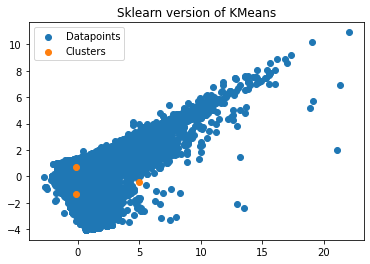

In [26]:
plt.scatter(reduced_data[:, 0], reduced_data[:, 1], label='Datapoints')
plt.scatter(km.cluster_centers_[:, 0], km.cluster_centers_[:, 1], label='Clusters')
plt.title("Sklearn version of KMeans")
plt.legend()
plt.show()

In [27]:
sse = []
k_rng = range(1,10)
for k in k_rng:
    km = KMeans(n_clusters=k)
    km.fit(df)
    sse.append(km.inertia_)

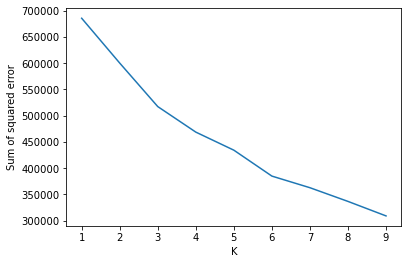

In [28]:
# lets try to plot a elbow method to find the best k value
plt.xlabel('K')
plt.ylabel('Sum of squared error')
plt.plot(k_rng,sse)
plt.show()

# 3 - Discovered in a Data

In [29]:
!pip install pandas_profiling

For each column the following statistics - if relevant for the column type - are presented in an interactive HTML report:

**Type inference**: detect the types of columns in a dataframe.

**Essentials**: type, unique values, missing values

**Quantile statistics** like minimum value, Q1, median, Q3, maximum, range, interquartile range

**Descriptive statistics** like mean, mode, standard deviation, sum, median absolute deviation, coefficient of variation, kurtosis, skewness

**Most frequent values**

**Histograms**

**Correlations** highlighting of highly correlated variables, Spearman, Pearson and Kendall matrices

**Missing values matrix**, count, heatmap and dendrogram of missing values

Duplicate rows Lists the most occurring duplicate rows

Text analysis learn about categories (Uppercase, Space), scripts (Latin, Cyrillic) and blocks (ASCII) of text data

In [30]:
import pandas_profiling as pp 

In [33]:
df1.profile_report()

# 4 - Anomalous data 

**Anomalous data can indicate critical incidents, such as a technical glitch, or potential opportunities, for instance a change in consumer behavior. Machine learning is progressively being used to automate anomaly detection.**

# 5-Exploring Advanced tools

In [33]:
# let try to separate the dependent and independent variable
X = df1.drop(['Total.Fatal.Injuries','ratio'], axis = 1)
y = df1['ratio']

In [34]:
# lets try to split the 20% data for testing and 80% for training
X_train, X_test, y_train, y_test = train_test_split(X,y, test_size = 0.2, random_state = 0)

In [35]:
print('Training Features Shape:', X_train.shape)
print('Training Labels Shape:', y_train.shape)
print('Testing Features Shape:', X_test.shape)
print('Testing Labels Shape:', y_test.shape)

Training Features Shape: (45712, 12)
Training Labels Shape: (45712,)
Testing Features Shape: (11428, 12)
Testing Labels Shape: (11428,)


In [36]:
linreg_pipeline = Pipeline([
                  ('std', StandardScaler()),            # standardize values
                  ('pca', PCA(n_components=.95)),       # feature engineer with PCA
                  ('lin', LinearRegression())           # apply model - try grid search
                  ])

knn_pipeline = Pipeline([
                  ('std', StandardScaler()),
                  ('pca', PCA(n_components=.95)),
                  ('knn', KNeighborsRegressor(10))
                  ])

dtree_pipeline = Pipeline([
                  ('std', StandardScaler()),
                  ('pca', PCA(n_components=.95)),
                  ('dtree', DecisionTreeRegressor())
                  ])

rforest_pipeline = Pipeline([
                  ('std', StandardScaler()),
                  ('pca', PCA(n_components=.95)),
                  ('rfr', RandomForestRegressor())
                  ])
MLP_pipeline = Pipeline([
                  ('std', StandardScaler()),
                  ('pca', PCA(n_components=.95)),
                  ('mlp', MLPRegressor(max_iter=500))
                  ])



# Prepare model pipeline
pipelines = [linreg_pipeline, knn_pipeline, dtree_pipeline, rforest_pipeline, MLP_pipeline]

model_names = ['Linear Regression', 'K Nearest Neighbors', 'Decision Tree', 'Random Forest','Multi Layer Preceptron']
count = 0

for p in pipelines:
    start_time = time.time()
    val_score = np.mean(cross_val_score(p, X_train, y_train, cv=5))
    p.fit(X_train, y_train)
    predictions = p.predict(X_test)

    print("")
    print(model_names[count])
    print("RMSE:", mean_squared_error(predictions, y_test, squared=False))
    print("R Square:", r2_score(predictions, y_test))
    print("MAE:", mean_absolute_error(predictions, y_test))
    print("Accuracy of Model with Cross Validation is :", round(val_score*100,3))
    print(f"Time for detection ({model_names[count]}) : {round((time.time() - start_time), 3)} seconds...")
    print("")
    count += 1



Linear Regression
RMSE: 0.2700346210504468
R Square: -0.5046104185757714
MAE: 0.178834551380329
Accuracy of Model with Cross Validation is : 39.724
Time for detection (Linear Regression) : 0.957 seconds...


K Nearest Neighbors
RMSE: 0.19554258585445894
R Square: 0.6142705983739889
MAE: 0.08410131641231684
Accuracy of Model with Cross Validation is : 66.993
Time for detection (K Nearest Neighbors) : 9.951 seconds...


Decision Tree
RMSE: 0.19825885953056163
R Square: 0.6843835379260821
MAE: 0.06332008505999823
Accuracy of Model with Cross Validation is : 65.143
Time for detection (Decision Tree) : 10.094 seconds...


Random Forest
RMSE: 0.1454643029769932
R Square: 0.7944265546891465
MAE: 0.061551995532132385
Accuracy of Model with Cross Validation is : 80.337
Time for detection (Random Forest) : 572.639 seconds...


Multi Layer Preceptron
RMSE: 0.09206581509391963
R Square: 0.9226410805855066
MAE: 0.049293580654958785
Accuracy of Model with Cross Validation is : 92.272
Time for detec